In [1]:
#import the base modules
import numpy as np #this is for linear algerbra
import pandas as pd #this is for data processing


In [4]:
#load the required documents
train_data = pd.read_csv('titanic/train.csv')
test_data = pd.read_csv('titanic/test.csv')
train_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


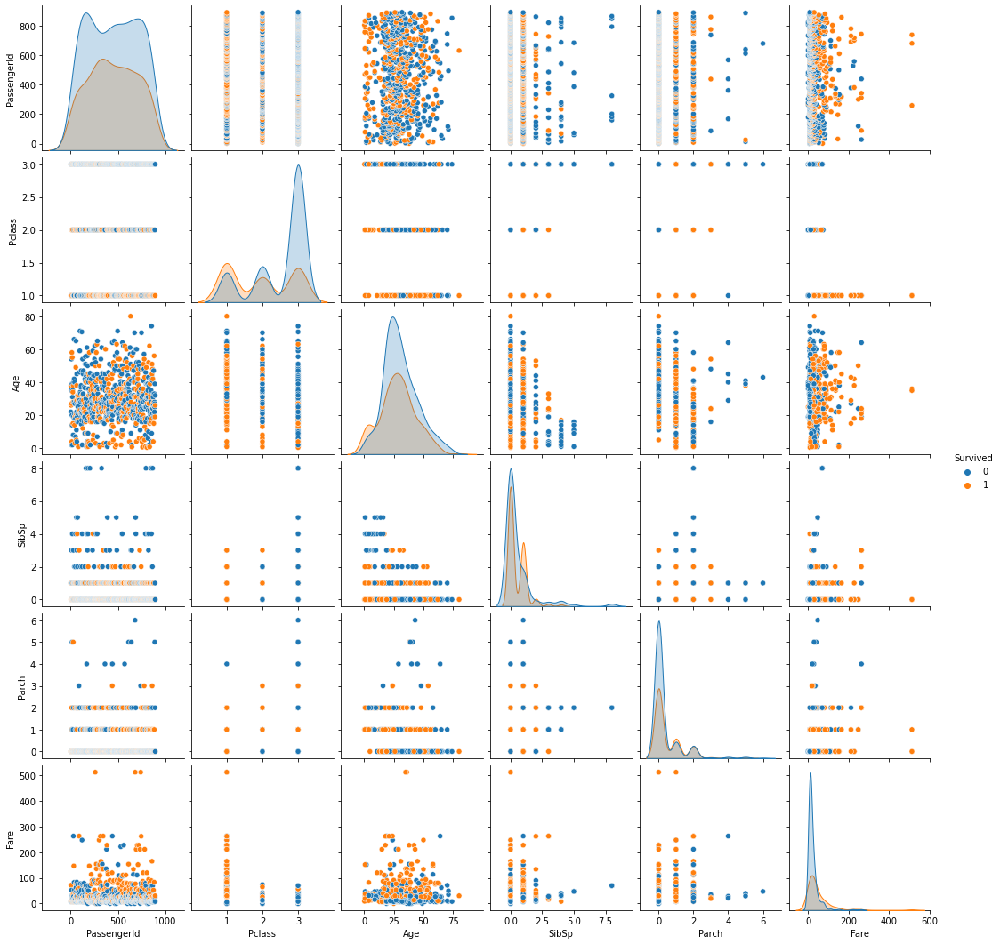

In [12]:
# show scatter plots of the different variables and save it as a file
%matplotlib inline
import seaborn as sns
survived_plot = sns.pairplot(train_data, hue = 'Survived')
survived_plot.savefig("survived_plot.png")

In [13]:
#cleanup the data and remove unnecessary data files
import re 
def cleanup_data(input_data):
    output_data = input_data.copy()
    #get the length of the name
    output_data['NameLen'] = input_data.Name.str.len()
    #converts sex data to numerical values of male and female
    output_data['Female'] = (output_data['Sex'] == 'male').astype('int') 
    output_data = pd.concat([output_data, pd.get_dummies(output_data.Embarked, prefix = 'Embarked')], axis = 1)
    # replace missing Age data with the mean age
    output_data['Age'] = output_data['Age'].fillna(output_data['Age'].mean())
    #replace missing Fare data with mean fare
    output_data['Fare'] = output_data['Fare'].fillna(output_data['Fare'].mean())

    # drop the columns not needed
    output_data.drop(columns=['Sex', 'Ticket', 'Cabin', 'Name', 'Embarked', 'Embarked_S', 'Deck_T', 'PassengerId'], inplace = True, errors = 'ignore')
    return output_data

train_index = train_data.shape[0]
data = pd.concat([train_data, test_data], axis = 0).reset_index(drop = True)
clean_data = cleanup_data(data)
clean_train_data = clean_data[0:train_index].copy()
clean_test_data = clean_data[train_index:].copy()
clean_test_data.drop(columns = ['Survived'], inplace = True)

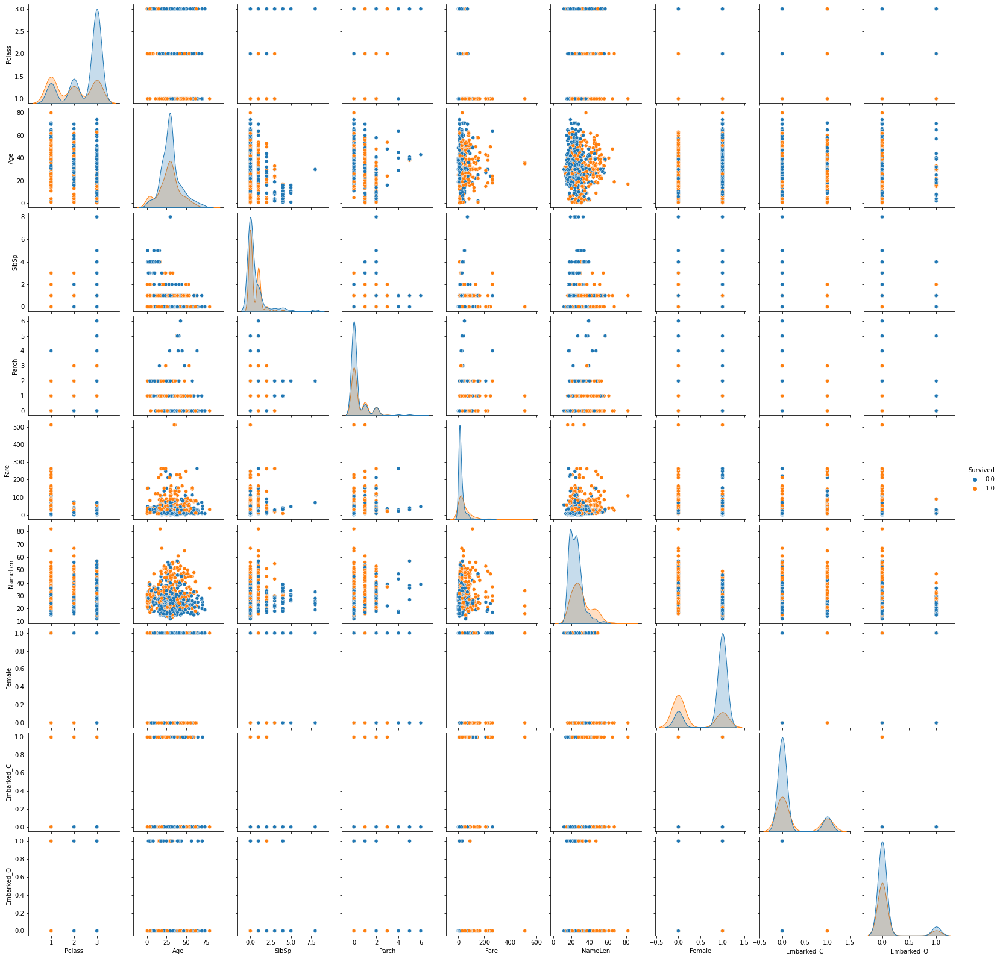

In [14]:
clean_survived_plot = sns.pairplot(clean_train_data, hue = 'Survived')
clean_survived_plot.savefig("clean_survived_plot.png")

In [15]:
#run a simple linear regression
from sklearn.linear_model import LogisticRegressionCV

slr = LogisticRegressionCV()
slr.fit(clean_train_data.drop(columns = ['Survived']), clean_train_data['Survived'])
clean_test_data['Survived'] = slr.predict(clean_test_data)
clean_test_data

,Pclass,Age,SibSp,Parch,Fare,NameLen,Female,Embarked_C,Embarked_Q,Survived
891,3,34.500000,0,0,7.8292,16,1,0,1,0.0
892,3,47.000000,1,0,7.0000,32,0,0,0,0.0
893,2,62.000000,0,0,9.6875,25,1,0,1,0.0
894,3,27.000000,0,0,8.6625,16,1,0,0,0.0
895,3,22.000000,1,1,12.2875,44,0,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...
1304,3,29.881138,0,0,8.0500,18,1,0,0,0.0
1305,1,39.000000,0,0,108.9000,28,0,1,0,1.0
1306,3,38.500000,0,0,7.2500,28,1,0,0,0.0
1307,3,29.881138,0,0,8.0500,19,1,0,0,0.0
